In [7]:
%matplotlib notebook
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta
import json
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re
from src.main.imu_data_io import *
from src.main.mando_data_io import *

In [8]:
def plot(imu_data, mandometer_data):
    # Extract IMU data components
    imu_x = imu_data['x']
    imu_y = imu_data['y']
    imu_z = imu_data['z']
    imu_time = imu_data['time']

    # Create subplots: 4 rows, 1 column
    fig = make_subplots(rows=4, cols=1, shared_xaxes=True)

    # IMU X-axis data plot
    fig.add_trace(go.Scatter(x=imu_time, y=imu_x, mode='lines', name='IMU X', line=dict(color='blue')), row=1, col=1)
    fig.update_yaxes(title_text='IMU X', row=1, col=1)

    # IMU Y-axis data plot
    fig.add_trace(go.Scatter(x=imu_time, y=imu_y, mode='lines', name='IMU Y', line=dict(color='red')), row=2, col=1)
    fig.update_yaxes(title_text='IMU Y', row=2, col=1)

    # IMU Z-axis data plot
    fig.add_trace(go.Scatter(x=imu_time, y=imu_z, mode='lines', name='IMU Z', line=dict(color='green')), row=3, col=1)
    fig.update_yaxes(title_text='IMU Z', row=3, col=1)

    # Mandometer data plot
    fig.add_trace(go.Scatter(y=mandometer_data, mode='lines', name='Mandometer Data', line=dict(color='purple')), row=4, col=1)
    fig.update_xaxes(title_text='Sample Number', row=4, col=1)
    fig.update_yaxes(title_text='Weight (grams)', row=4, col=1)

    # Update titles and layout
    fig.update_layout(height=800, width=1000, title_text='IMU and Mandometer Data', template='plotly_white')

    fig.show()


In [13]:
path = "../data/raw/19"
mando_data = load_raw_mando_data(path)
acc_data, gyro_data = load_raw_sensor_data(path)

In [14]:
plot(acc_data, mando_data)

In [20]:
# IMU actual clap time
imu_clap_time_str = '15:36:41.3018'  # hh:mm:ss.ms format
imu_clap_time = datetime.strptime(imu_clap_time_str, '%H:%M:%S.%f')

# Video actual clap time
video_clap_time_str = '16:37:14.1500'  # hh:mm:ss.ms format
video_clap_time = datetime.strptime(video_clap_time_str, '%H:%M:%S.%f')

# Calculate dt (time difference)
dt = video_clap_time - imu_clap_time

# Output dt
print("Time Difference (dt):", dt)


Time Difference (dt): 1:00:32.848200


<IPython.core.display.Javascript object>


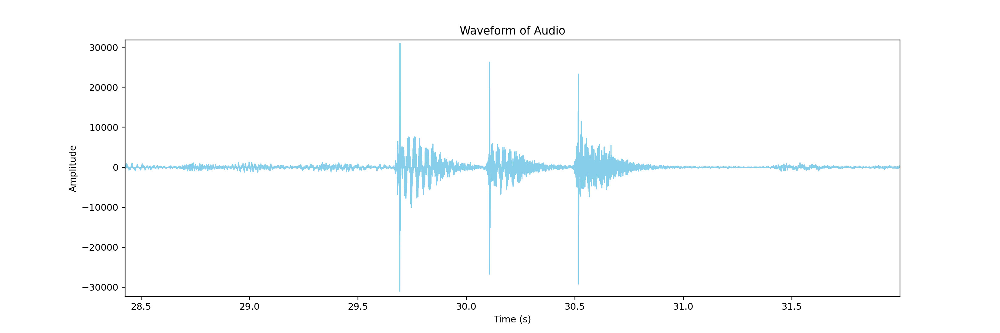

In [30]:
from scipy.io import wavfile
path = "/Users/yiannislevy/Documents/repos/Thesis/extracted_data/manually_extracted_dataset/19) Christos Chrysikos/video.nosync/audio.wav"
# Load the audio file
samplerate, data = wavfile.read(path)

# Plotting the waveform
times = np.arange(len(data)) / float(samplerate)

plt.figure(figsize=(15, 5))
plt.fill_between(times, data, color='skyblue')
plt.xlim(times[0], times[-1])
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Audio')
plt.show()
